In [112]:
import sys
import os
import math
import random

from matplotlib import pyplot as plt
from matplotlib.patches import Patch
import numpy as np
from PointNetLK.ptlk import so3
from PointNetLK.ptlk.pointnet import PointNet_features, PointNet_classifier
from PointNetLK.ptlk.pointlk import PointLK
from PIL import Image
from sklearn import svm
from sklearn.metrics import classification_report
import torch
import trimesh

# %matplotlib notebook
%matplotlib inline

# Task 1: Use PointLK to Register and Visualize the Registration

## Since PointNetLK uses .off files, we will first generate .off files for each data sample. As well as generate train/test directories.

In [69]:
folders_path = r"C:\Users\HannanKhan\Google Drive\PycharmProjects\cse6363project1\Cleaned_PatientData"


def delete_generated_OFF_files(folders_path: str):
    for folder in os.listdir(folders_path):
        for file in os.listdir(folders_path + "\\" + folder):
            if os.path.isdir(folders_path + "\\" + folder + "\\" + file):
                for off_file in os.listdir(folders_path + "\\" + folder + "\\" + file):
                    os.remove(folders_path + "\\" + folder +
                              "\\" + file + "\\" + off_file)
                    print(folders_path + "\\" + folder + "\\" +
                          file + "\\" + off_file + "  removed.")


def generate_OFF_files_for_folders(folders_path: str):
    for folder in os.listdir(folders_path):
        for file in os.listdir(folders_path + "\\" + folder):
            # first we make the train and test folders if they don't exist.
            try:
                os.mkdir(folders_path + "\\" + folder + "\\train")
            except FileExistsError:
                pass
            try:
                os.mkdir(folders_path + "\\" + folder + "\\test")
            except FileExistsError:
                pass
            if file.endswith(".csv"):
                # next we load up the xyz data points for this patient.
                xyz_data = np.genfromtxt(folders_path + "\\" + folder + "\\" + folder +
                                         "_eam_data.csv", delimiter=",", skip_header=1)[:, [2, 3, 4]]
            with open(folders_path + "\\" + folder + "\\train\\" + folder + "_001.off", "w+") as OFF_file:
                OFF_file.write("OFF\n")
                OFF_file.write(str(xyz_data.shape[0]) + " 0 0\n")
                for i in range(xyz_data.shape[0]):
                    for j in range(3):
                        OFF_file.write(str(xyz_data[i][j]))
                        if j != 2:
                            OFF_file.write(" ")
                    OFF_file.write("\n")
                print(folders_path + "\\" + folder + "\\train\\" +
                      folder + "_001.off" + "  done.")
            with open(folders_path + "\\" + folder + "\\test\\" + folder + "_001.off", "w+") as OFF_file:
                OFF_file.write("OFF\n")
                OFF_file.write(str(xyz_data.shape[0]) + " 0 0\n")
                for i in range(xyz_data.shape[0]):
                    for j in range(3):
                        OFF_file.write(str(xyz_data[i][j]))
                        if j != 2:
                            OFF_file.write(" ")
                    OFF_file.write("\n")
                print(folders_path + "\\" + folder + "\\test\\" +
                      folder + "_001.off" + "  done.")


# delete_generated_OFF_files(folders_path)
generate_OFF_files_for_folders(folders_path)

C:\Users\HannanKhan\Google Drive\PycharmProjects\cse6363project1\Cleaned_PatientData\43612\train\43612_001.off  done.
C:\Users\HannanKhan\Google Drive\PycharmProjects\cse6363project1\Cleaned_PatientData\43612\test\43612_001.off  done.
C:\Users\HannanKhan\Google Drive\PycharmProjects\cse6363project1\Cleaned_PatientData\43612\train\43612_001.off  done.
C:\Users\HannanKhan\Google Drive\PycharmProjects\cse6363project1\Cleaned_PatientData\43612\test\43612_001.off  done.
C:\Users\HannanKhan\Google Drive\PycharmProjects\cse6363project1\Cleaned_PatientData\47191\train\47191_001.off  done.
C:\Users\HannanKhan\Google Drive\PycharmProjects\cse6363project1\Cleaned_PatientData\47191\test\47191_001.off  done.
C:\Users\HannanKhan\Google Drive\PycharmProjects\cse6363project1\Cleaned_PatientData\47191\train\47191_001.off  done.
C:\Users\HannanKhan\Google Drive\PycharmProjects\cse6363project1\Cleaned_PatientData\47191\test\47191_001.off  done.
C:\Users\HannanKhan\Google Drive\PycharmProjects\cse6363proj

## First we visualize one single pointcloud

In [2]:
def get_single_pointcloud(path, include_data=False):
    """Returns the xyz coordinates of a pointcloud path (stored as a csv).
    Can also return with the data (unipolar and bipolar values) attached."""

    single_pcl = np.genfromtxt(fname=path, delimiter=",", skip_header=1)
    single_pcl_xyz = single_pcl[:, [2, 3, 4]]
    if include_data:
        return np.concatenate([single_pcl_xyz, single_pcl[:, [5, 6]]], axis=1)
    return single_pcl_xyz


single_pcl_xyz = get_single_pointcloud(
    r".\Cleaned_PatientData\43612\43612_eam_data.csv")
print(single_pcl_xyz)

[[ 50.3461 -40.655  115.122 ]
 [ 50.3461 -40.655  115.122 ]
 [ 43.6787 -35.2732 119.76  ]
 ...
 [ 18.0797 -31.9207  91.882 ]
 [ 29.5982 -31.8061  90.5978]
 [ 22.1432 -34.2743  89.0804]]


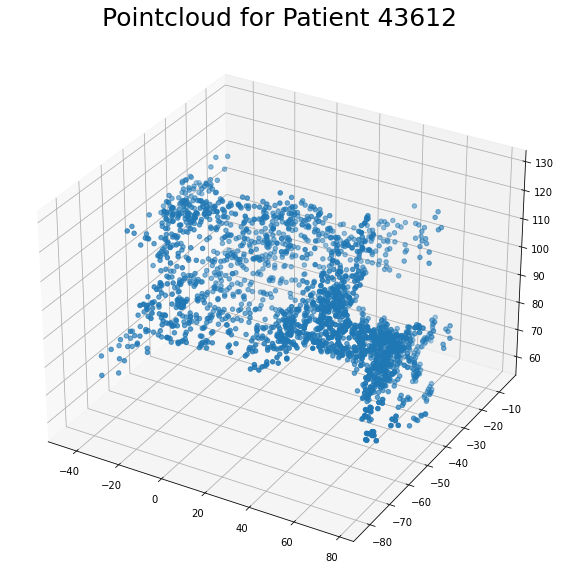

In [3]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(single_pcl_xyz[:, 0], single_pcl_xyz[:, 1], single_pcl_xyz[:, 2])
ax.set_title("Pointcloud for Patient 43612", fontsize=25)
plt.show()

## We find out which pointcloud has the most points

In [4]:
def find_largest_pointcloud(folders_path: str):
    """Finds the largest pointcloud from a set of folders."""

    print("Folder \t Dimensions")
    largest_pointcloud_size = 0
    largest_pointcloud = ""
    smallest_pointcloud_size = 10000000000
    smallest_pointcloud = ""

    for folder in os.listdir(folders_path):
        for file in os.listdir(folders_path + "\\" + folder):
            if file.endswith(".csv"):
                # next we load up the xyz data points for this patient.
                xyz_data = get_single_pointcloud(
                    folders_path + "\\" + folder + "\\" + folder + "_eam_data.csv")
                if xyz_data.shape[0] >= largest_pointcloud_size:
                    largest_pointcloud_size = xyz_data.shape[0]
                    largest_pointcloud = str(folder)
                if xyz_data.shape[0] <= smallest_pointcloud_size:
                    smallest_pointcloud_size = xyz_data.shape[0]
                    smallest_pointcloud = str(folder)
                print(folder, "\t", xyz_data.shape)

    return largest_pointcloud_size, largest_pointcloud, smallest_pointcloud_size, smallest_pointcloud


largest_pointcloud_size, largest_pointcloud, smallest_pointcloud_size, smallest_pointcloud = find_largest_pointcloud(
    r"C:\Users\HannanKhan\Google Drive\PycharmProjects\cse6363project1\Cleaned_PatientData")

print("\nLargest pointcloud and number of points:",
      largest_pointcloud, largest_pointcloud_size)
print("\nSmallest pointcloud and number of points:",
      smallest_pointcloud, smallest_pointcloud_size)

Folder 	 Dimensions
43612 	 (2494, 3)
47191 	 (594, 3)
47510 	 (882, 3)
48448 	 (1593, 3)
48916 	 (4916, 3)
49659 	 (4471, 3)
50144 	 (4003, 3)
50219 	 (2793, 3)
50901 	 (406, 3)
51914 	 (1374, 3)
52997 	 (2683, 3)
53258 	 (765, 3)

Largest pointcloud and number of points: 48916 4916

Smallest pointcloud and number of points: 50901 406


## Lets visualize the largest pointcloud

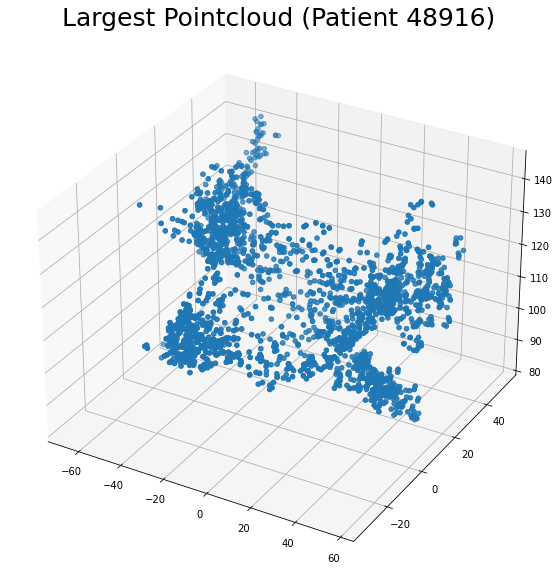

In [5]:
single_pcl_xyz = get_single_pointcloud(
    r".\Cleaned_PatientData\48916\48916_eam_data.csv")

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(single_pcl_xyz[:, 0], single_pcl_xyz[:, 1], single_pcl_xyz[:, 2])
ax.set_title("Largest Pointcloud (Patient 48916)", fontsize=25)
plt.show()

## Now we can test our registration on the largest pointcloud
```The largest pointcloud is in patient 48916.
We will use this patient as an example from now on.```

In [12]:
def get_rotation_array(theta_rot):
    """Returns a 3x3 array that will rotate by theta degrees."""

    rotation = np.asarray([[math.cos(theta), math.sin(theta), 0],
                           [-math.sin(theta), math.cos(theta), 0],
                           [0, 0, 1]])
    return rotation


def get_rotated_translated_pointcloud(pointcloud, theta_rot, translation):
    """Returns an xyz array pointcloud that has been rotated by
    theta_rot radians, and then translated by translation.
    pointcloud must be xyz array.    [[x, y, z],
                                      ...,
                                      [x, y, z]]
    rotation must be in radians: math.pi/2
    translation shape must be 3 element list. [x, y, z]

    reference:
    https://www.mathworks.com/help/vision/ref/pctransform.html"""

    rotation = get_rotation_array(theta_rot)
    translation = np.asarray(translation)
    pointcloud_rot_trans = np.matmul(pointcloud, rotation) + translation
    print("rotation\n", rotation)
    print("translation\n", translation)
    print("original pointcloud\n", pointcloud)
    print("rotated/translated pointcloud\n", pointcloud_rot_trans)

    return pointcloud_rot_trans


theta = math.pi/4
translation = [100, 100, 100]
single_pcl_xyz_rot = get_rotated_translated_pointcloud(
    single_pcl_xyz, theta, translation)

rotation
 [[ 0.70710678  0.70710678  0.        ]
 [-0.70710678  0.70710678  0.        ]
 [ 0.          0.          1.        ]]
translation
 [100 100 100]
original pointcloud
 [[ 50.9463   33.1372  109.704  ]
 [ 50.9463   33.1372  109.704  ]
 [ 45.2229   31.7316  113.761  ]
 ...
 [-29.4748    7.05565 138.329  ]
 [-30.9732    7.68152 137.527  ]
 [-30.9732    7.68152 137.527  ]]
rotated/translated pointcloud
 [[112.59293538 159.45601304 209.704     ]
 [112.59293538 159.45601304 209.704     ]
 [109.53978972 154.41504879 213.761     ]
 ...
 [ 74.16907109  84.14726701 238.329     ]
 [ 72.66698536  83.53029513 237.527     ]
 [ 72.66698536  83.53029513 237.527     ]]


<IPython.core.display.Javascript object>


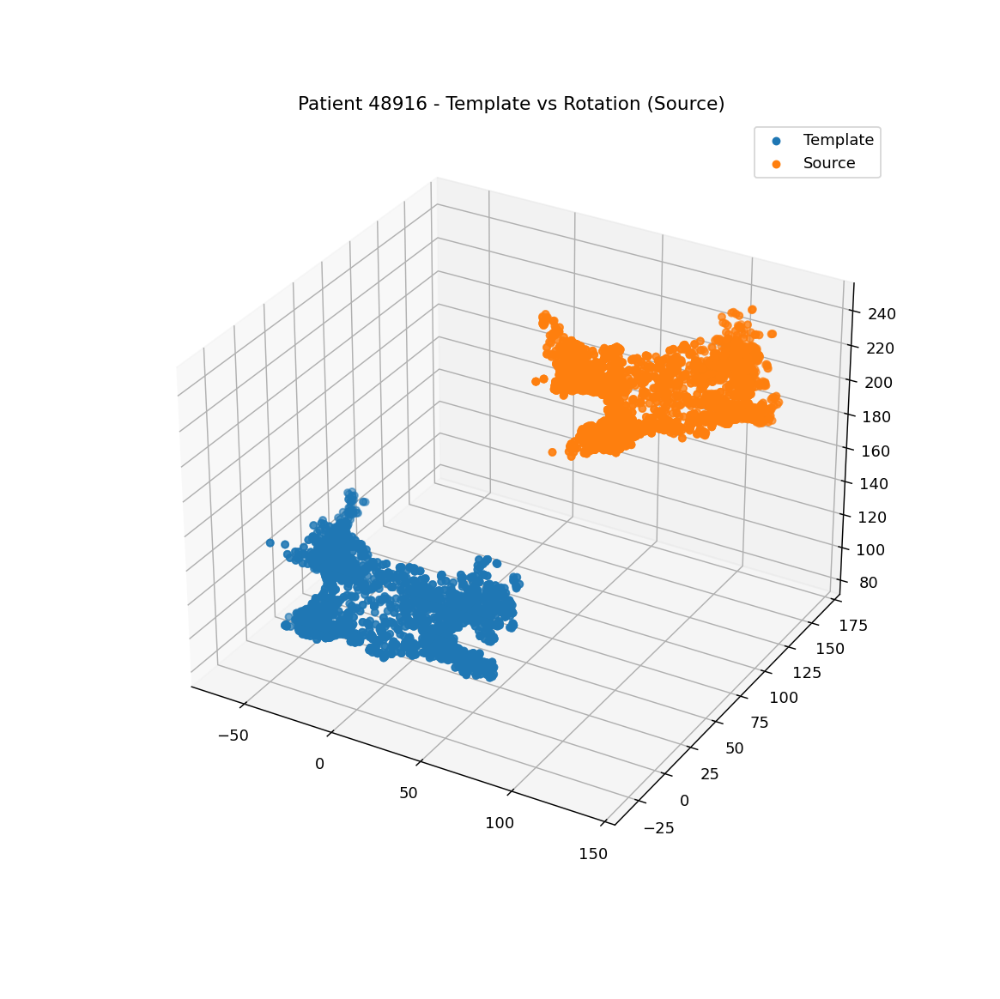

In [13]:
# %matplotlib notebook

fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111, projection="3d")
ax.set_title("Patient 48916 - Template vs Rotation (Source)")
ax.scatter(single_pcl_xyz[:, 0], single_pcl_xyz[:, 1], single_pcl_xyz[:, 2])
ax.scatter(single_pcl_xyz_rot[:, 0],
           single_pcl_xyz_rot[:, 1], single_pcl_xyz_rot[:, 2])
ax.legend(["Template", "Source"])
plt.show()

## Next we train the PointNetLK model using shell commands:

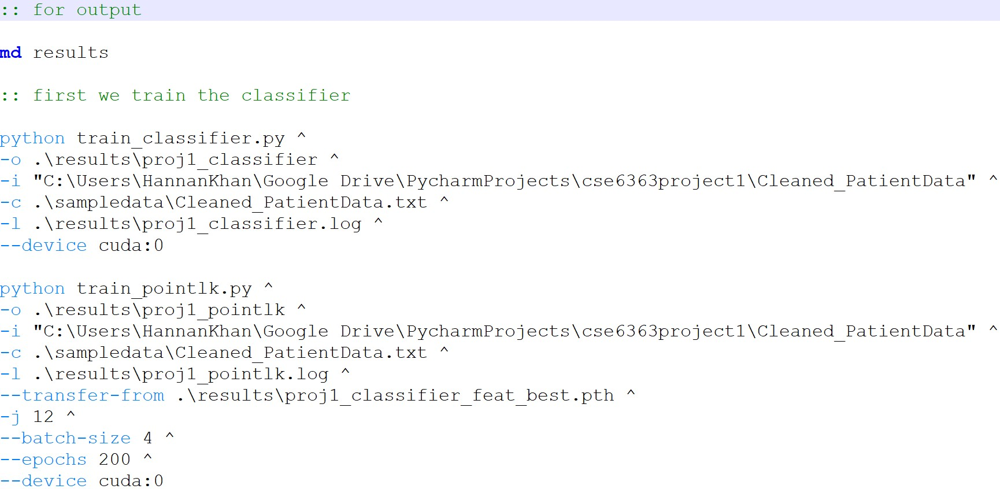

## Now we can load our trained PointNetLK model and run some iterations to see the results

In [14]:
pointNet_features = PointNet_features()
pointLK_model = PointLK(ptnet=pointNet_features)
pointLK_model.load_state_dict(torch.load(
    r"./PointNetLK/experiments/results/proj1_pointlk_model_best.pth"))
print(pointLK_model)

pointLK_model.eval()
p0 = torch.from_numpy(single_pcl_xyz).float()  # template (1, N, 3)
p0 = torch.reshape(p0, (1, -1, 3)).float()
p1 = torch.from_numpy(single_pcl_xyz_rot).float()  # source (1, M, 3)
p1 = torch.reshape(p1, (1, -1, 3)).float()
print(f"p0.shape=={p0.shape}")
print(f"p1.shape=={p1.shape}")

maxiter = 16
r = pointLK_model.do_forward(pointLK_model, p0=p0, p1=p1, maxiter=maxiter)
est_g = pointLK_model.g  # (1, 4, 4)

# print(f"r.shape=={r.shape}")

print(f"est_g\n{est_g}")
print(f"r\n{r}")

PointLK(
  (ptnet): PointNet_features(
    (h1): Sequential(
      (0): Conv1d(3, 64, kernel_size=(1,), stride=(1,))
      (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv1d(64, 64, kernel_size=(1,), stride=(1,))
      (4): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
    )
    (h2): Sequential(
      (0): Conv1d(64, 64, kernel_size=(1,), stride=(1,))
      (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv1d(64, 128, kernel_size=(1,), stride=(1,))
      (4): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
      (6): Conv1d(128, 1024, kernel_size=(1,), stride=(1,))
      (7): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): ReLU()
    )
  )
)
p0.shape==torch.Size([1, 4916, 3])
p1.shape==torch.Size([1, 491

## We see that the rotation and translation matrices closely matches the est_g.

```
The top-left 9 values in est_g align with our rotation matrix.

The 3 right-most values in est_g are close to the translation matrix.

Another thing to notice: EVEN WITH 0 ITERATIONS, PointNetLK is capable of computing translations. I think this is because translations need to be identified before rotations. Also, translations can possibly be easier to compute (get most outer points in cloud, form a polygon, computer center of both template and source to get translation). This makes sense as computing translations first will allow for easier alignment later.

FOR EXAMPLE: running 0 iterations on the first patients original and rotation clouds yields this est_g:
est_g
tensor([[[  1.0000,   0.0000,   0.0000, -65.6792],
         [  0.0000,   1.0000,   0.0000, -48.2818],
         [  0.0000,   0.0000,   1.0000,   0.0000],
         [  0.0000,   0.0000,   0.0000,   1.0000]]])
This already has translation values of [-65, -48, 0].

```

In [15]:
print("rotation matrix\n", get_rotation_array(theta))
print("est_g rotation portion\n", est_g.detach().numpy()[:, :3, :3])

print("translation matrix\n", translation)
print("est_g rotation portion\n", est_g.detach().numpy()[:, :3, 3].transpose())

rotation matrix
 [[ 0.70710678  0.70710678  0.        ]
 [-0.70710678  0.70710678  0.        ]
 [ 0.          0.          1.        ]]
est_g rotation portion
 [[[ 7.0710677e-01  7.0710677e-01 -7.3967826e-08]
  [-7.0710671e-01  7.0710677e-01 -3.8923986e-08]
  [-5.0614716e-08  4.8989815e-08  9.9999988e-01]]]
translation matrix
 [100, 100, 100]
est_g rotation portion
 [[-1.4142136e+02]
 [ 1.9073486e-06]
 [-9.9999969e+01]]


## We can see that the registration has worked over 16 iterations.

<IPython.core.display.Javascript object>


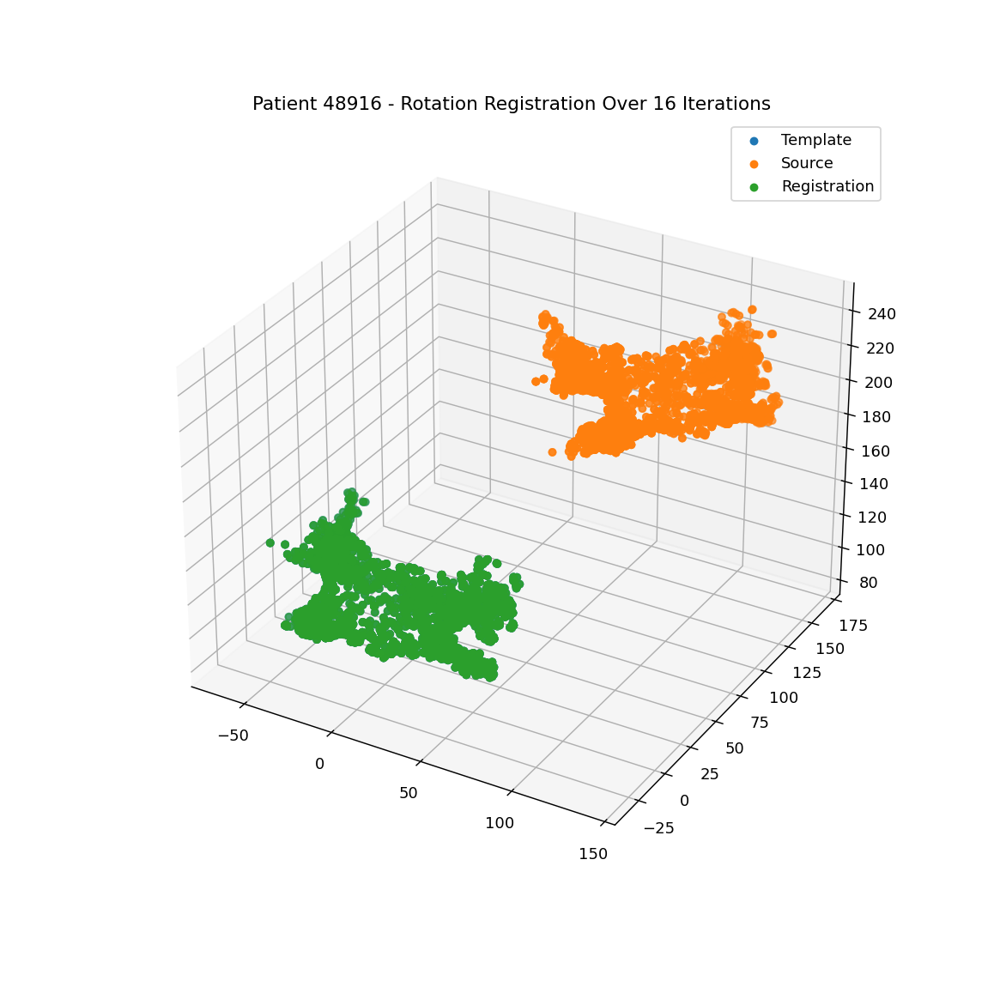

In [16]:
# we apply the estimated rotation to the original point cloud to get an estimated point cloud.
# print(est_g.detach().numpy()[:, :3, :3])
single_pcl_xyz_est_g = np.matmul(single_pcl_xyz_rot, np.linalg.inv(
    est_g.detach().numpy()[:, :3, :3])) + est_g.detach().numpy()[:, :3, 3]

fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(single_pcl_xyz[:, 0], single_pcl_xyz[:, 1], single_pcl_xyz[:, 2])
ax.scatter(single_pcl_xyz_rot[:, 0],
           single_pcl_xyz_rot[:, 1], single_pcl_xyz_rot[:, 2])
ax.scatter(single_pcl_xyz_est_g[:, :, 0],
           single_pcl_xyz_est_g[:, :, 1], single_pcl_xyz_est_g[:, :, 2])
ax.set_title(
    f"Patient 48916 - Rotation Registration Over {maxiter} Iterations")
ax.legend(["Template", "Source", "Registration"])
plt.show()

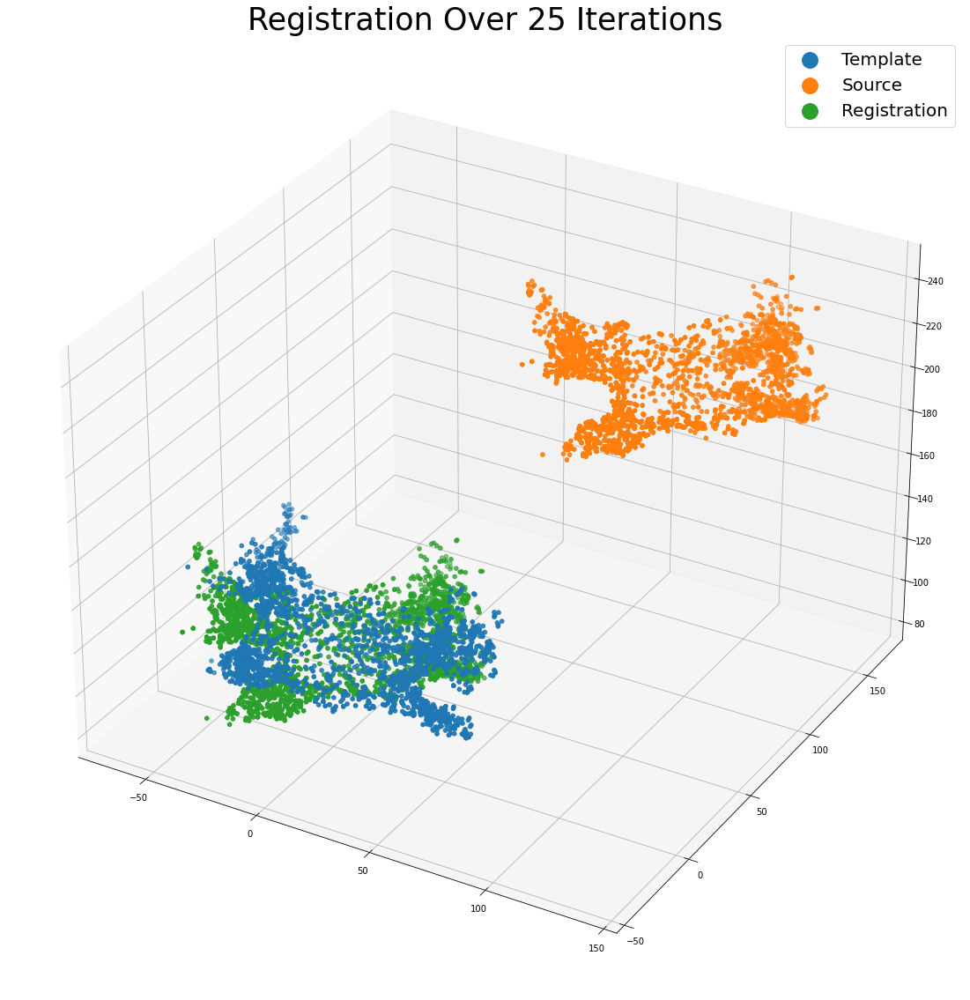

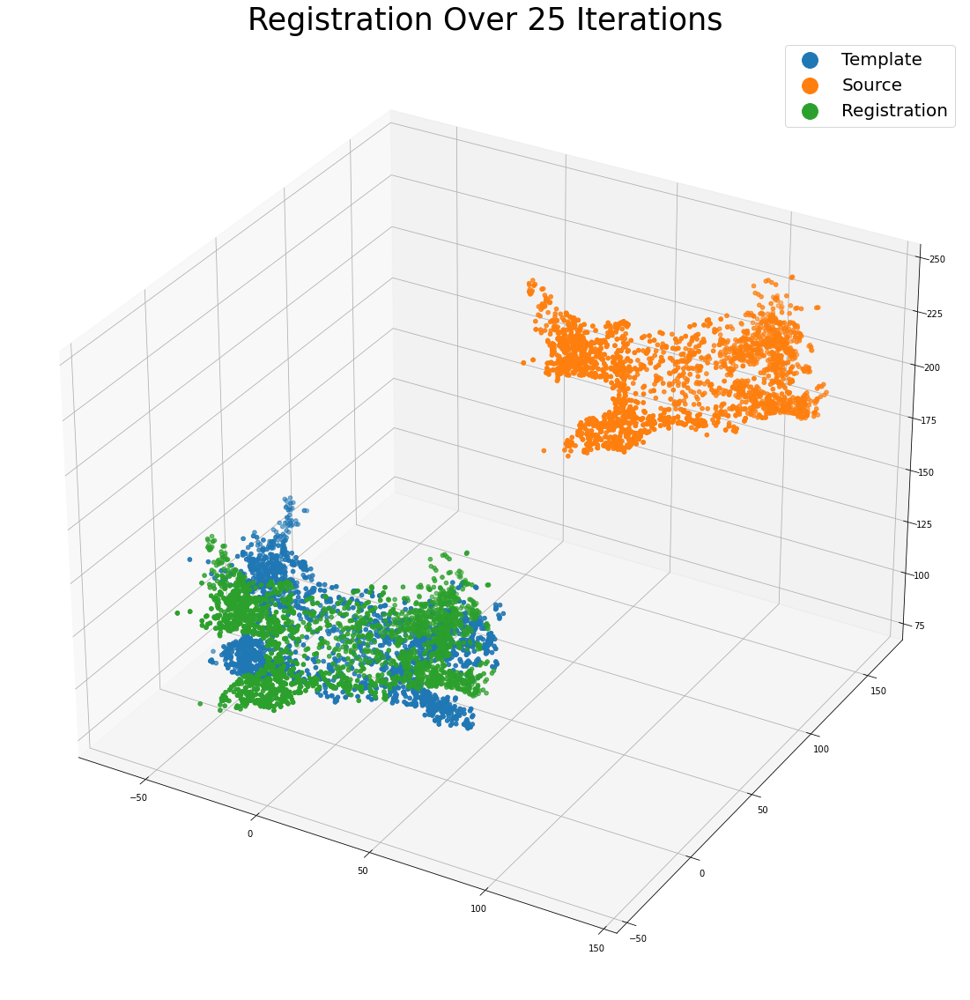

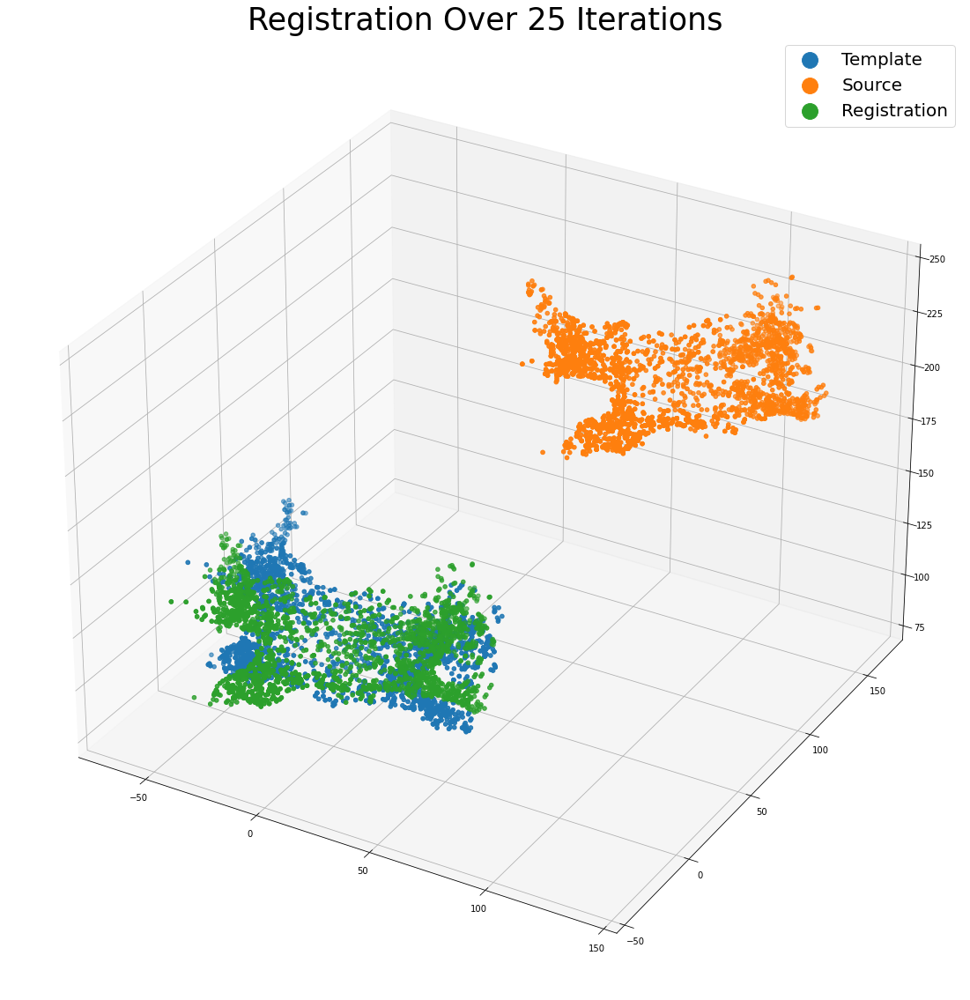

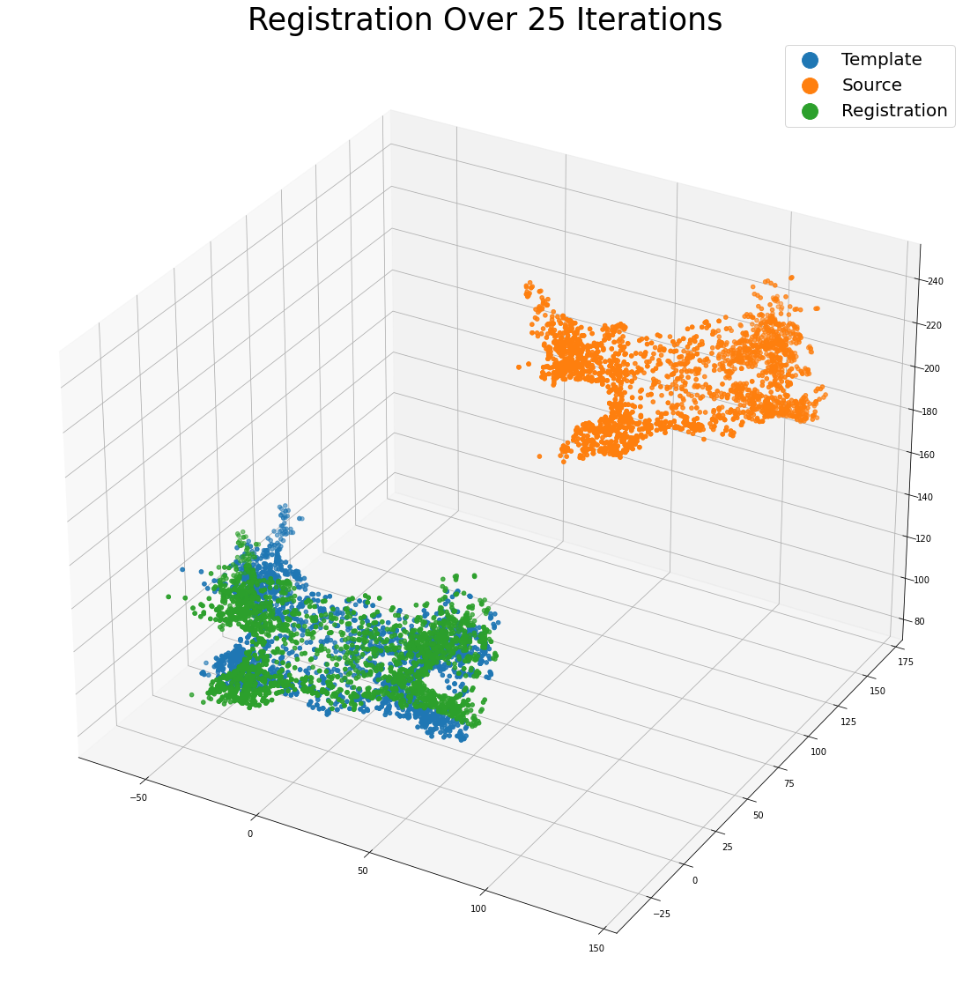

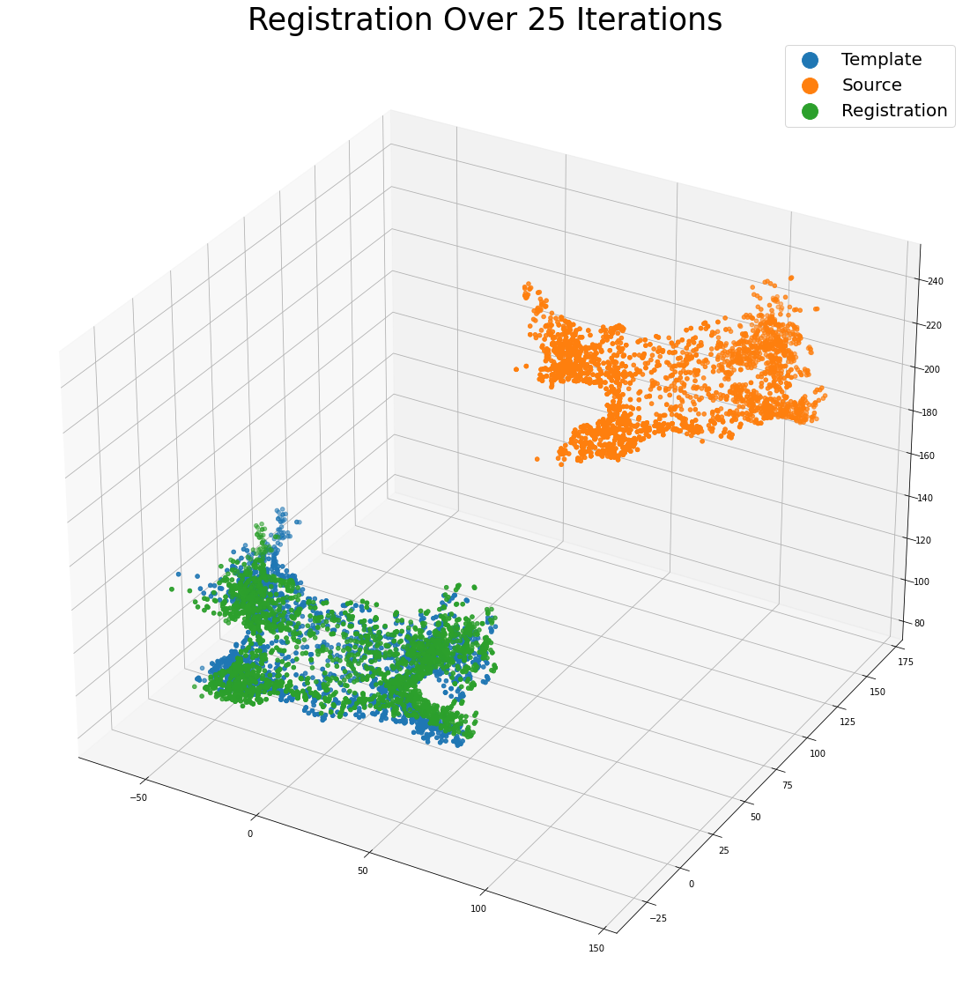

...

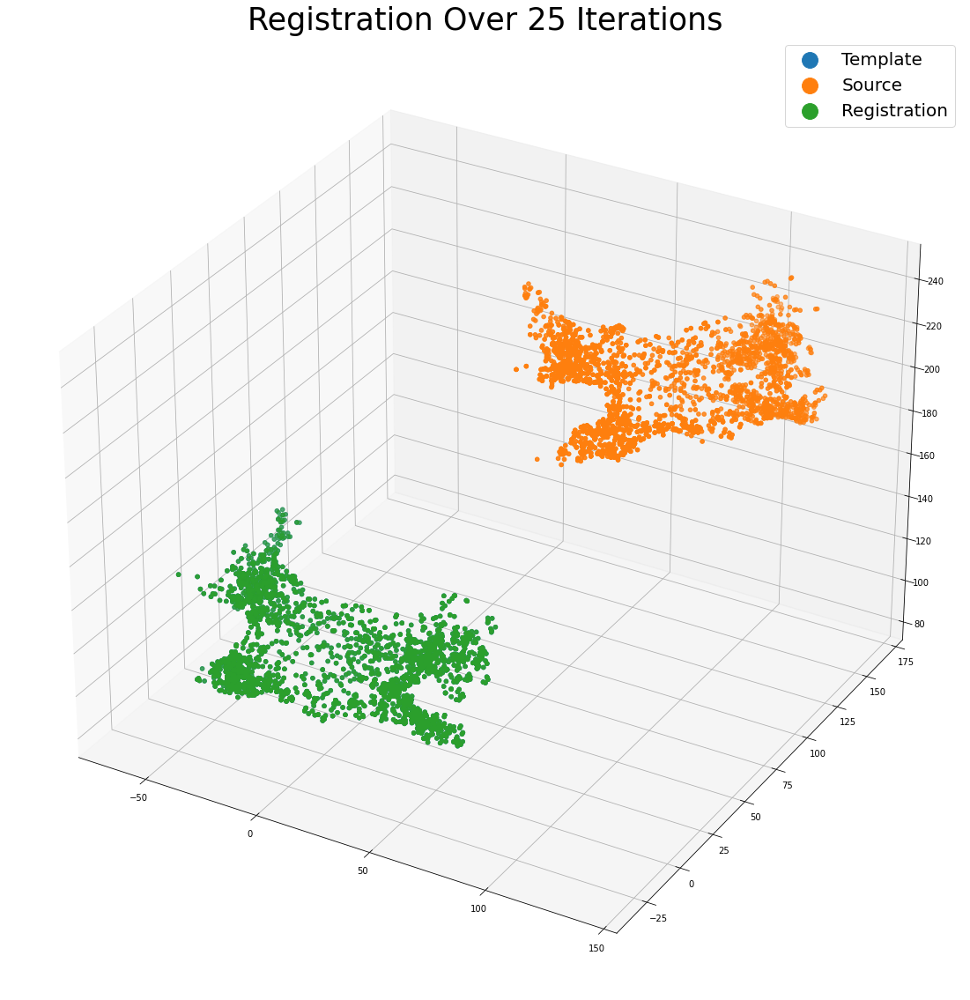

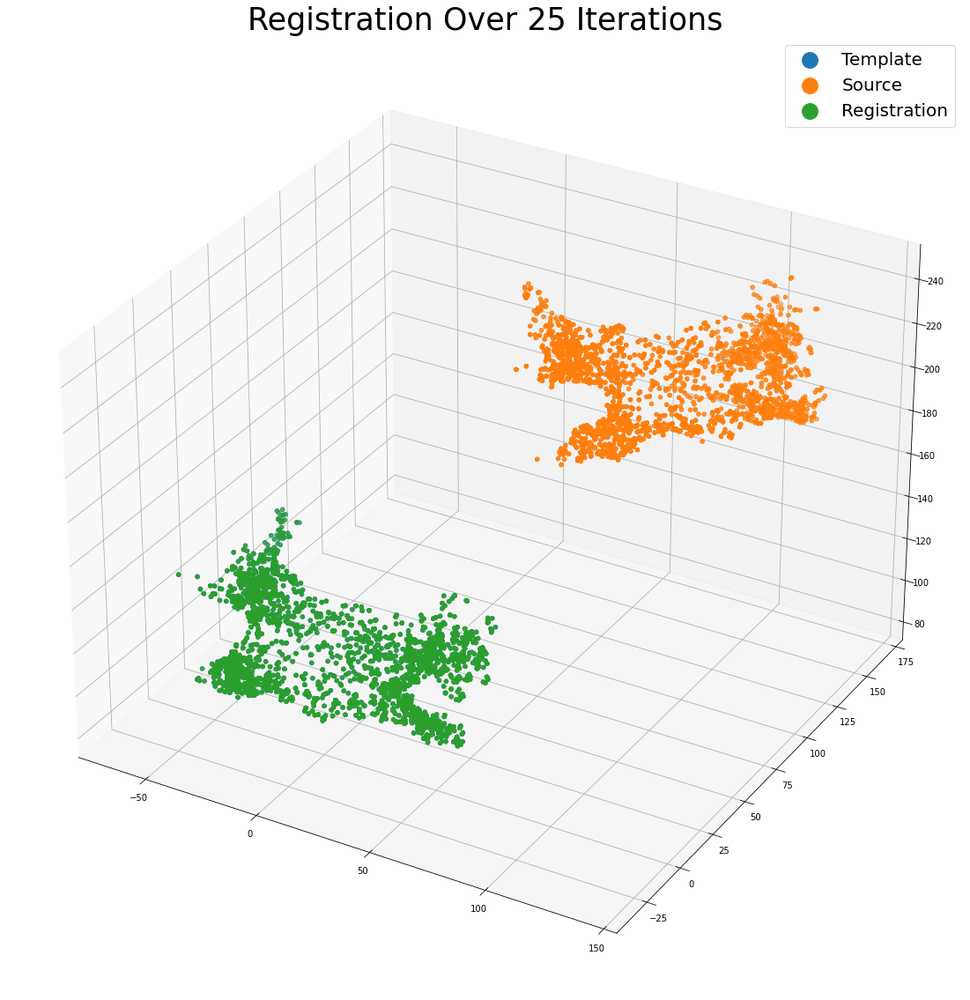

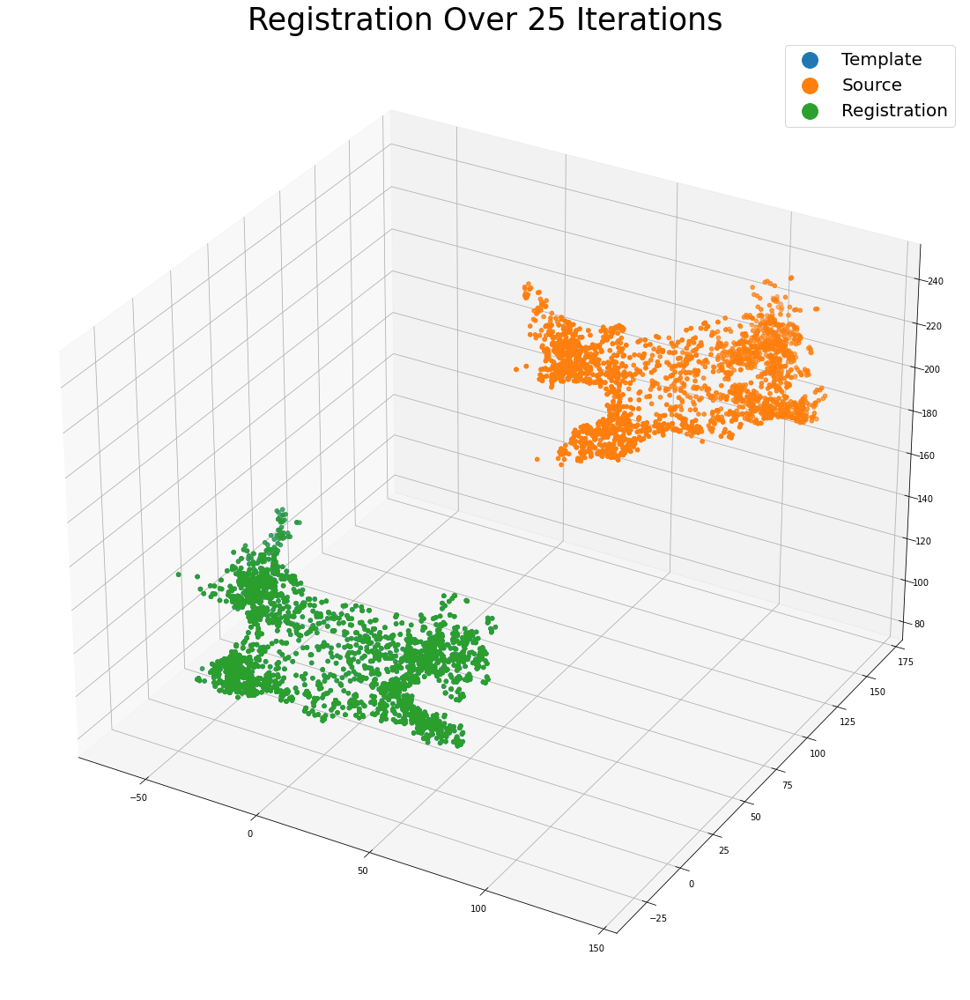

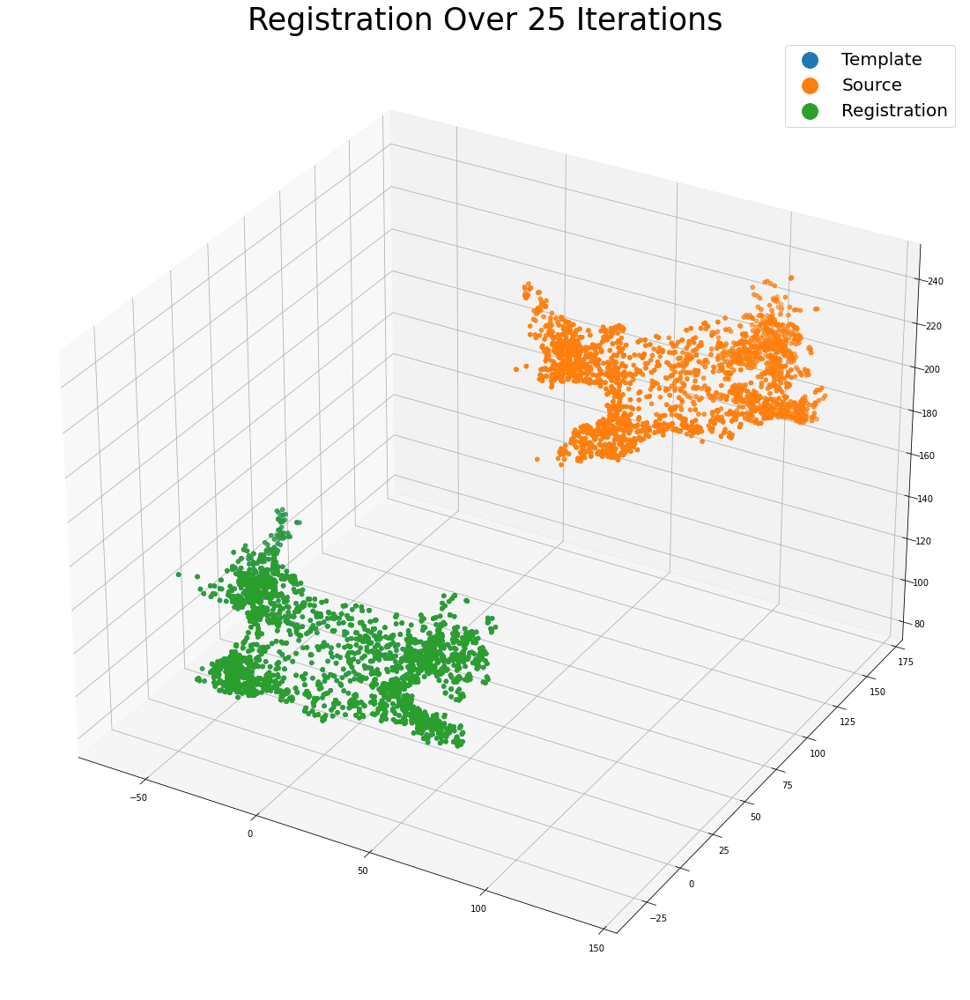

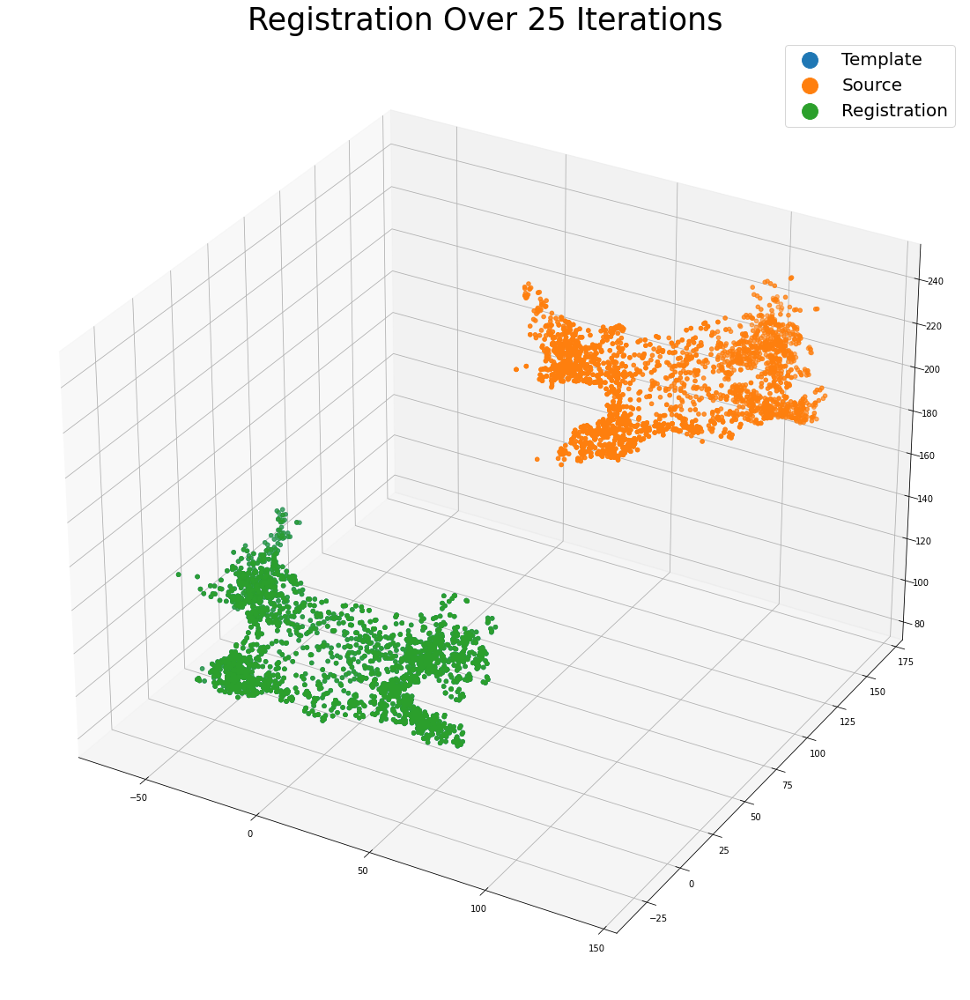

In [17]:
%matplotlib inline
num_iterations = 25

for i in range(num_iterations):
    pointNet_features = PointNet_features()
    pointLK_model = PointLK(ptnet=pointNet_features)
    pointLK_model.load_state_dict(torch.load(
        r"./PointNetLK/experiments/results/proj1_pointlk_model_best.pth"))
    pointLK_model.eval()
    p0 = torch.from_numpy(single_pcl_xyz).float()  # template (1, N, 3)
    p0 = torch.reshape(p0, (1, -1, 3)).float()
    p1 = torch.from_numpy(single_pcl_xyz_rot).float()  # source (1, M, 3)
    p1 = torch.reshape(p1, (1, -1, 3)).float()
    r = pointLK_model.do_forward(pointLK_model, p0=p0, p1=p1, maxiter=i)
    est_g = pointLK_model.g  # (1, 4, 4)
    # we find the inverse of the est_g matrix (for rotation) so we can do matrix multiplication.
    # we then add on the translation matrix that is part of est_g (the three right-most values).
    single_pcl_xyz_est_g = np.matmul(single_pcl_xyz_rot, np.linalg.inv(
        est_g.detach().numpy()[:, :3, :3])) + est_g.detach().numpy()[:, :3, 3]

    fig = plt.figure(figsize=(20, 20))

    ax = fig.add_subplot(111, projection="3d")
    ax.scatter(single_pcl_xyz[:, 0],
               single_pcl_xyz[:, 1], single_pcl_xyz[:, 2])
    ax.scatter(
        single_pcl_xyz_rot[:, 0], single_pcl_xyz_rot[:, 1], single_pcl_xyz_rot[:, 2])
    ax.scatter(single_pcl_xyz_est_g[:, :, 0],
               single_pcl_xyz_est_g[:, :, 1], single_pcl_xyz_est_g[:, :, 2])
    ax.set_title(f"Registration Over {num_iterations} Iterations", fontsize=35)
    ax.legend(["Template", "Source", "Registration"],
              fontsize=20, markerscale=4)
    plt.savefig(f"./images/{i}.png")
    plt.show()

images = [Image.open(f"./images/{i}.png") for i in range(num_iterations)]
images[0].save('./images/gifs/48916_rotation.gif', save_all=True,
               append_images=images[1:], optimize=False, duration=300, loop=0)

## Here is the GIF of the previous iterations:

<!-- <img src="complete.gif" width="1000" align="left"> -->

![SegmentLocal](images/gifs/48916_rotation.gif "48916 rotation")

In [18]:
other_single_pcl_xyz = get_single_pointcloud(
    r".\Cleaned_PatientData\47191\47191_eam_data.csv")
other_single_pcl_xyz

array([[ 34.2638 ,  17.8251 , 140.617  ],
       [ 28.7275 ,  20.8352 , 136.528  ],
       [ 22.2388 ,  24.5581 , 137.714  ],
       ...,
       [ -6.90152,   9.38825, 113.58   ],
       [  4.36845,  24.9004 , 109.343  ],
       [  3.9163 ,  11.6667 ,  99.6863 ]])

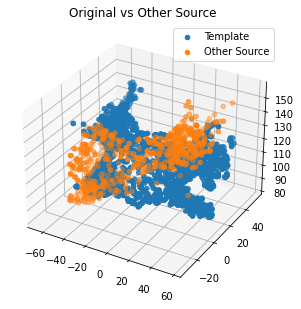

In [19]:
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111, projection="3d")
ax.set_title("Original vs Other Source")
ax.scatter(single_pcl_xyz[:, 0], single_pcl_xyz[:, 1], single_pcl_xyz[:, 2])
ax.scatter(other_single_pcl_xyz[:, 0],
           other_single_pcl_xyz[:, 1], other_single_pcl_xyz[:, 2])
ax.legend(["Template", "Other Source"])
plt.show()

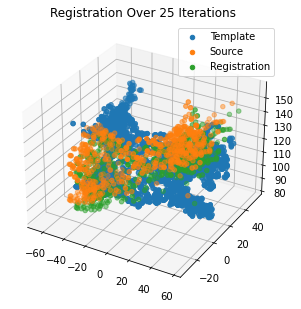

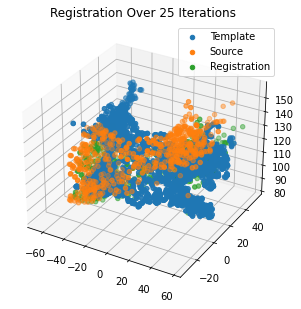

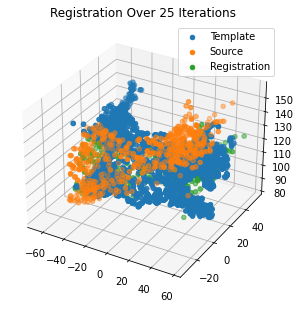

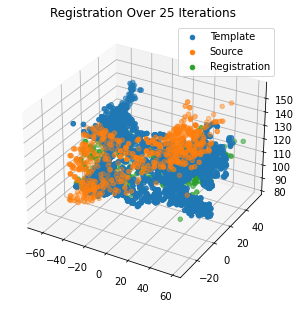

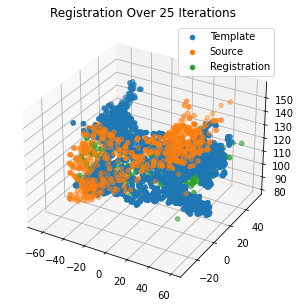

...

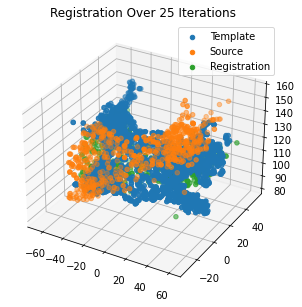

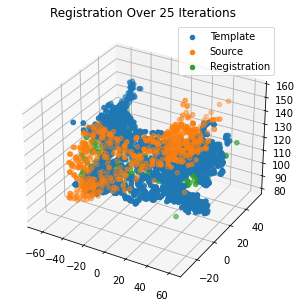

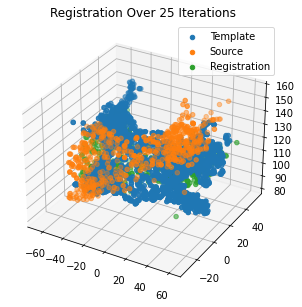

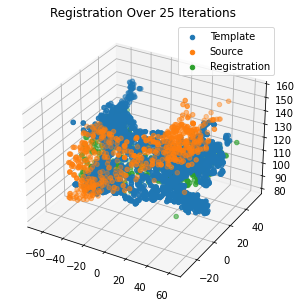

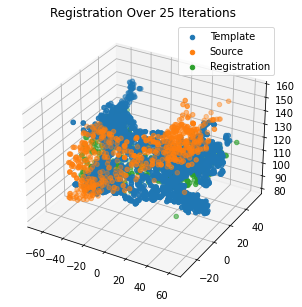

In [20]:
%matplotlib inline
num_iterations = 25

for i in range(num_iterations):
    pointNet_features = PointNet_features()
    pointLK_model = PointLK(ptnet=pointNet_features)
    pointLK_model.load_state_dict(torch.load(
        r"./PointNetLK/experiments/results/proj1_pointlk_model_best.pth"))
    pointLK_model.eval()
    p0 = torch.from_numpy(single_pcl_xyz).float()  # template (1, N, 3)
    p0 = torch.reshape(p0, (1, -1, 3)).float()
    p1 = torch.from_numpy(other_single_pcl_xyz).float()  # source (1, M, 3)
    p1 = torch.reshape(p1, (1, -1, 3)).float()
    r = pointLK_model.do_forward(pointLK_model, p0=p0, p1=p1, maxiter=i)
    est_g = pointLK_model.g  # (1, 4, 4)
    # we find the inverse of the est_g matrix (for rotation) so we can do matrix multiplication.
    # we then add on the translation matrix that is part of est_g (the three right-most values).
    other_pcl_xyz_est_g = np.matmul(other_single_pcl_xyz, np.linalg.inv(
        est_g.detach().numpy()[:, :3, :3])) + est_g.detach().numpy()[:, :3, 3]

    fig = plt.figure(figsize=(5, 5))

    ax = fig.add_subplot(111, projection="3d")
    ax.scatter(single_pcl_xyz[:, 0],
               single_pcl_xyz[:, 1], single_pcl_xyz[:, 2])
    ax.scatter(
        other_single_pcl_xyz[:, 0], other_single_pcl_xyz[:, 1], other_single_pcl_xyz[:, 2])
    ax.scatter(other_pcl_xyz_est_g[:, :, 0],
               other_pcl_xyz_est_g[:, :, 1], other_pcl_xyz_est_g[:, :, 2])
    ax.set_title(f"Registration Over {num_iterations} Iterations")
    ax.legend(["Template", "Source", "Registration"])
    # ax.set_axis_off()
#     plt.savefig(f"./images/{i}.png")
    plt.show()

In [27]:
def register_pointcloud_and_graph(template_name, source_name, template_pcl_path, source_pcl_path, num_iterations, show=False, generate_gif=False):
    template_pcl_xyz = get_single_pointcloud(template_pcl_path)
    source_pcl_xyz = get_single_pointcloud(source_pcl_path)

    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(111, projection="3d")
    ax.set_title("Original vs Other Source")
    ax.scatter(template_pcl_xyz[:, 0],
               template_pcl_xyz[:, 1], template_pcl_xyz[:, 2])
    ax.scatter(source_pcl_xyz[:, 0],
               source_pcl_xyz[:, 1], source_pcl_xyz[:, 2])
    ax.legend(["Template", "Other Source"])
    if show:
        plt.show()
    else:
        plt.close(fig)

    for i in range(num_iterations):
        pointNet_features = PointNet_features()
        pointLK_model = PointLK(ptnet=pointNet_features)
        pointLK_model.load_state_dict(torch.load(
            r"./PointNetLK/experiments/results/proj1_pointlk_model_best.pth"))
        pointLK_model.eval()
        p0 = torch.from_numpy(template_pcl_xyz).float()  # template (1, N, 3)
        p0 = torch.reshape(p0, (1, -1, 3)).float()
        p1 = torch.from_numpy(source_pcl_xyz).float()  # source (1, M, 3)
        p1 = torch.reshape(p1, (1, -1, 3)).float()
        r = pointLK_model.do_forward(pointLK_model, p0=p0, p1=p1, maxiter=i)
        est_g = pointLK_model.g  # (1, 4, 4)
        # we find the inverse of the est_g matrix (for rotation) so we can do matrix multiplication.
        # we then add on the translation matrix that is part of est_g (the three right-most values).
        other_pcl_xyz_est_g = np.matmul(source_pcl_xyz, np.linalg.inv(
            est_g.detach().numpy()[:, :3, :3])) + est_g.detach().numpy()[:, :3, 3]

        fig = plt.figure(figsize=(20, 20))

        ax = fig.add_subplot(111, projection="3d")
        ax.scatter(template_pcl_xyz[:, 0],
                   template_pcl_xyz[:, 1], template_pcl_xyz[:, 2])
        ax.scatter(source_pcl_xyz[:, 0],
                   source_pcl_xyz[:, 1], source_pcl_xyz[:, 2])
        ax.scatter(
            other_pcl_xyz_est_g[:, :, 0], other_pcl_xyz_est_g[:, :, 1], other_pcl_xyz_est_g[:, :, 2])
        ax.set_title(
            f"Registration Over {num_iterations} Iterations", fontsize=35)
        ax.legend(["Template", "Source", "Registration"],
                  fontsize=20, markerscale=4)
        if generate_gif:
            plt.savefig(f"./images/{i}.png")
        if show:
            plt.show()
        else:
            plt.close(fig)
    if generate_gif:
        images = [Image.open(f"./images/{i}.png")
                  for i in range(num_iterations)]
        images[0].save(f'./images/gifs/{template_name}_{source_name}.gif', save_all=True,
                       append_images=images[1:], optimize=False, duration=300, loop=0)


register_pointcloud_and_graph("48916", "47191", r".\Cleaned_PatientData\48916\48916_eam_data.csv",
                              r".\Cleaned_PatientData\47191\47191_eam_data.csv", 25, show=False, generate_gif=False)

## Here is the GIF of the previous registration 48916 and 47191:

![SegmentLocal](images/gifs/48916_47191.gif "48916_47191")

In [29]:
register_pointcloud_and_graph("48916", "52997", r".\Cleaned_PatientData\48916\48916_eam_data.csv",
                              r".\Cleaned_PatientData\52997\52997_eam_data.csv", 25, show=False, generate_gif=False)

## Here is the GIF of the previous registration 48916 and 52997:

![SegmentLocal](images/gifs/48916_52997.gif "48916_52997")

In [31]:
folders_path = r"C:\Users\HannanKhan\Google Drive\PycharmProjects\cse6363project1\Cleaned_PatientData"

for folder in os.listdir(folders_path):
    folder_path = f".\Cleaned_PatientData\{folder}\{folder}_eam_data.csv"
    register_pointcloud_and_graph("48916", folder, r".\Cleaned_PatientData\48916\48916_eam_data.csv",
                                  folder_path, 25, show=False, generate_gif=True)

# Task 2: Use SVM or MLP to Classify the Registered Point Clouds
## First we load the labels

In [6]:
labels_df = pd.read_excel(r".\label.xlsx", index_col="Study number")
labels_df

,AF type,1Y re AF
Study number,,
87066,1,0
63562,1,0
53258,2,0
50901,2,0
14189,2,0
...,...,...
89929,1,0
43612,1,1
28476,1,0


In [7]:
print(labels_df.loc[43612], "\n")
np.asarray(labels_df.loc[43612])

AF type     1
1Y re AF    1
Name: 43612, dtype: int64 



array([1, 1], dtype=int64)

In [8]:
# Get the unique values of 'AF type' and '1Y re AF'.
print("AF type unique", labels_df["AF type"].unique())
print("1Y re AF unique", labels_df["1Y re AF"].unique())

AF type unique [1 2 3]
1Y re AF unique [0 1]


## Time to create a plan
    
    Here is the breakdown of my plan:
        1. Iterate through all pointclouds, and register them to the largest pointcloud (patient 48916).
        2. Generate a large dataframe that contains all registered pointclouds, along with each points AF type and 1Y re AF values.
        3. Feed the dataframe into a SVM for training, with the labels being AF type and 1Y re AF values.
        4. Predict test data using trained SVM model.

In [9]:
def get_pointcloud_register_attach_labels(template_name, source_name, template_pcl_xyz, source_path, maxiter=16):
    """This function will get the source pointcloud, register it to the template pointcloud,
    attach the original data back to the pointcloud ndarray, then return it."""

    source_pcl_w_data = np.genfromtxt(
        fname=source_path, delimiter=",", skip_header=1)
    source_pcl_xyz = source_pcl_w_data[:, [2, 3, 4]]

    # we register the source to the template using the pointNetLK model we have trained.
    pointNet_features = PointNet_features()
    pointLK_model = PointLK(ptnet=pointNet_features)
    pointLK_model.load_state_dict(torch.load(
        r"./PointNetLK/experiments/results/proj1_pointlk_model_best.pth"))
    pointLK_model.eval()
    p0 = torch.from_numpy(template_pcl_xyz).float()  # template (1, N, 3)
    p0 = torch.reshape(p0, (1, -1, 3)).float()
    p1 = torch.from_numpy(source_pcl_xyz).float()  # source (1, M, 3)
    p1 = torch.reshape(p1, (1, -1, 3)).float()
    r = pointLK_model.do_forward(pointLK_model, p0=p0, p1=p1, maxiter=maxiter)
    est_g = pointLK_model.g  # (1, 4, 4)
    # we calculate the registered pcl xyz coordinates.
    registered_src_pcl_xyz = np.matmul(source_pcl_xyz, np.linalg.inv(
        est_g.detach().numpy()[:, :3, :3])) + est_g.detach().numpy()[:, :3, 3]

    # now we attach the original data back to the registered source pcl xyz coordinates.
    # the data attached includes the unipolar and bipolar values.
    registered_src_pcl_w_data = np.concatenate(
        [registered_src_pcl_xyz.reshape((-1, 3)), source_pcl_w_data[:, [5, 6]]], axis=1)
    return registered_src_pcl_w_data


template_pcl_xyz = get_single_pointcloud(
    r".\Cleaned_PatientData\48916\48916_eam_data.csv")
template_pcl_w_data = get_single_pointcloud(
    r".\Cleaned_PatientData\48916\48916_eam_data.csv", include_data=True)
registered_src_pcl_w_data = get_pointcloud_register_attach_labels("48916", "43612", template_pcl_xyz,
                                                                  r".\Cleaned_PatientData\43612\43612_eam_data.csv")

## As a sanity check, lets make sure that the pointcloud has actually been registered

In [10]:
non_registered_src_pcl_xyz = get_single_pointcloud(
    r".\Cleaned_PatientData\43612\43612_eam_data.csv")
print("Non-Registered PCL\tRegistered PCL")
for i in range(0, 25, 2):
    print("%3.3f %3.3f %3.3f\t%3.3f %3.3f %3.3f" % (non_registered_src_pcl_xyz[i, 0], non_registered_src_pcl_xyz[i, 1],
                                                    non_registered_src_pcl_xyz[i,
                                                                               2], registered_src_pcl_w_data[i, 0],
                                                    registered_src_pcl_w_data[i, 1], registered_src_pcl_w_data[i, 2]))

Non-Registered PCL	Registered PCL
50.346 -40.655 115.122	30.827 2.233 138.212
43.679 -35.273 119.760	25.475 7.617 144.320
47.432 -40.676 115.277	28.001 2.934 138.398
48.227 -42.237 121.527	27.977 -0.500 143.906
39.836 -37.801 92.511	22.834 14.081 117.582
41.232 -45.312 94.831	22.119 6.129 117.585
42.932 -46.482 109.489	22.541 0.416 131.234
42.715 -48.633 101.789	22.266 0.691 123.246
50.397 -54.089 107.075	27.955 -7.863 126.591
45.655 -52.064 100.988	24.278 -3.014 121.433
51.633 -60.101 99.328	28.100 -11.515 117.407
38.423 -36.559 90.678	21.902 16.121 116.213
41.316 -46.906 100.182	21.458 3.109 122.235


## Now we can create the data for the SVM model
```
Since there are only 12 patients data available, we will use 10 patients for training, and 2 patients for testing.
```

In [11]:
folders_path = r"C:\Users\HannanKhan\Google Drive\PycharmProjects\cse6363project1\Cleaned_PatientData"
flat_train_arr = []
target_train_arr = []
flat_test_arr = []
target_test_arr = []

num_patients = len(next(os.walk(folders_path))[1])
train_size = math.ceil(num_patients*0.8)
print("\nLargest pointcloud and number of points:",
      largest_pointcloud, largest_pointcloud_size)
print("Smallest pointcloud and number of points:",
      smallest_pointcloud, smallest_pointcloud_size)
print(f"{num_patients} patients detected.")
print(f"{train_size} allocated for train set.")
print(f"{num_patients-train_size} allocated for test set.")

for i, folder in enumerate(os.listdir(folders_path)):
    folder_path = f".\Cleaned_PatientData\{folder}\{folder}_eam_data.csv"
    registered_src_pcl_w_data = get_pointcloud_register_attach_labels(
        "48916", folder, template_pcl_xyz, folder_path)
    # training set
    if i <= train_size:
        random_sampling = random.sample(
            range(registered_src_pcl_w_data.shape[0]), smallest_pointcloud_size)
        regist_src_pcl_w_data_uniform_sampled = registered_src_pcl_w_data[random_sampling, :]
        flat_train_arr.append(regist_src_pcl_w_data_uniform_sampled.flatten())
        try:
            target_train_arr.append(np.asarray(labels_df.loc[int(folder)]))
            print(f"{folder} completed.")
        except KeyError:
            print(
                f"{folder} not detected in labels dataframe. Deleting from train set...", file=sys.stderr)
            flat_train_arr.pop()
    else:
        # test set.
        random_sampling = random.sample(
            range(registered_src_pcl_w_data.shape[0]), smallest_pointcloud_size)
        regist_src_pcl_w_data_uniform_sampled = registered_src_pcl_w_data[random_sampling, :]
        flat_test_arr.append(regist_src_pcl_w_data_uniform_sampled.flatten())
        try:
            target_test_arr.append(np.asarray(labels_df.loc[int(folder)]))
            print(f"{folder} completed.")
        except KeyError:
            print(
                f"{folder} not detected in labels dataframe. Deleting from test set...", file=sys.stderr)
            flat_test_arr.pop()

# flat_train_arr = np.asarray(flat_train_arr)
flat_train_df = pd.DataFrame(flat_train_arr)
flat_test_df = pd.DataFrame(flat_test_arr)
target_train_df = pd.DataFrame(target_train_arr, columns=labels_df.columns)
target_test_df = pd.DataFrame(target_test_arr, columns=labels_df.columns)


print(f"Train set size == {flat_train_df.shape}")
print(f"Test set size == {flat_test_df.shape}")
print(f"Target Train set size == {target_train_df.shape}")
print(f"Target Test set size == {target_test_df.shape}")


Largest pointcloud and number of points: 48916 4916

Smallest pointcloud and number of points: 50901 406
12 patients detected.
10 allocated for train set.
2 allocated for test set.
43612 completed.
47191 completed.


47510 not detected in labels dataframe. Deleting from train set...


48448 completed.


48916 not detected in labels dataframe. Deleting from train set...


49659 completed.


50144 not detected in labels dataframe. Deleting from train set...
50219 not detected in labels dataframe. Deleting from train set...


50901 completed.
51914 completed.
52997 completed.
53258 completed.
Train set size == (7, 2030)
Test set size == (1, 2030)
Target Train set size == (7, 2)
Target Test set size == (1, 2)


In [12]:
flat_train_df = pd.concat([flat_train_df, target_train_df], axis=1)
flat_train_df

,0,1,2,3,4,5,6,7,8,9,...,2022,2023,2024,2025,2026,2027,2028,2029,AF type,1Y re AF
0,49.423742,4.392880,109.412239,0.762,0.033,26.898291,15.555601,107.953571,0.579,0.315,...,107.823211,2.337,1.620,-45.669111,13.359138,140.991647,0.438,0.462,1,1
1,38.091288,10.815757,121.144456,4.161,1.122,-42.930872,6.393621,102.950774,1.359,0.309,...,121.634258,6.978,2.346,23.166688,19.070773,121.934293,2.823,1.719,1,0
2,-37.835668,24.737356,102.607568,0.195,0.123,0.970523,25.475323,109.603704,0.156,0.015,...,91.187190,0.243,0.042,2.203064,23.114469,111.959604,0.669,0.096,2,0
3,42.802535,3.583854,97.365010,0.357,0.009,-29.365090,5.896767,103.578749,0.627,0.366,...,94.937816,0.570,0.213,-35.114509,-7.997303,103.062207,0.699,0.042,1,0
4,-7.670362,2.965303,113.873129,1.689,0.027,-29.235280,0.037118,107.987573,1.422,0.048,...,100.717136,1.254,0.039,13.145498,21.488502,99.971217,1.554,0.015,2,0
5,-54.440799,26.836287,148.168396,0.549,0.183,-6.590701,22.920281,126.963242,0.423,0.102,...,124.492182,1.170,0.219,9.064828,10.089115,133.239146,0.504,0.045,1,1
6,12.228114,26.450702,137.945057,0.333,0.063,17.025375,1.995111,109.113753,0.132,0.006,...,113.075488,0.297,0.084,-30.530230,24.016835,140.833956,0.120,0.033,2,0


In [13]:
flat_test_df = pd.concat([flat_test_df, target_test_df], axis=1)
flat_test_df

,0,1,2,3,4,5,6,7,8,9,...,2022,2023,2024,2025,2026,2027,2028,2029,AF type,1Y re AF
0,26.687304,19.813014,94.475438,0.513,0.009,2.234964,15.28338,93.758981,0.606,0.363,...,133.979482,0.453,0.084,-45.965082,10.06243,134.194835,0.714,0.12,2,0


In [14]:
X_train = flat_train_df.iloc[:, :-2]
Y_train = flat_train_df.iloc[:, -2:]
X_test = flat_test_df.iloc[:, :-2]
Y_test = flat_test_df.iloc[:, -2:]

print(f"X_train size == {X_train.shape}")
print(f"Y_train set size == {Y_train.shape}")
print(f"X_test size == {X_test.shape}")
print(f"Y_test size == {Y_test.shape}")

X_train size == (7, 2030)
Y_train set size == (7, 2)
X_test size == (1, 2030)
Y_test size == (1, 2)


## Now we will create/train/test two SVM models, one to predict 'AF type' and one to predict '1Y re AF'

In [113]:
svc_AF_lin = svm.SVC(kernel='linear')
svc_AF_lin.fit(X_train, Y_train["AF type"])

SVC(kernel='linear')

In [114]:
y_pred = svc_AF_lin.predict(X_test)
print("Linear SVM:::\npredicted AF data: ", y_pred)
print("actual AF data: ", Y_test["AF type"].values)

Linear SVM:::
predicted AF data:  [2]
actual AF data:  [2]


In [115]:
print(classification_report(Y_test["AF type"], y_pred))

              precision    recall  f1-score   support

           2       1.00      1.00      1.00         1

    accuracy                           1.00         1
   macro avg       1.00      1.00      1.00         1
weighted avg       1.00      1.00      1.00         1



In [116]:
svc_1Y_lin = svm.SVC(kernel="linear")
svc_1Y_lin.fit(X_train, Y_train["1Y re AF"])

SVC(kernel='linear')

In [117]:
y_pred = svc_1Y_lin.predict(X_test)
print("Linear SVM:::\npredicted AF data: ", y_pred)
print("actual AF data: ", Y_test["1Y re AF"].values)

Linear SVM:::
predicted AF data:  [0]
actual AF data:  [0]


In [118]:
print(classification_report(Y_test["1Y re AF"], y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1

    accuracy                           1.00         1
   macro avg       1.00      1.00      1.00         1
weighted avg       1.00      1.00      1.00         1



```
Since we had only one patient to test this dataset on, AND we got both predictions
of "AF type" and "1Y re AF" correct, the accuracy is 1 for both models.
```

# Task 3: Analyze Which Type of Feature Contributes More to Classification

In [84]:
print(svc_AF_lin.n_features_in_)
print(svc_1Y_lin.n_features_in_)

2030
2030


```
So there are 2030 features being fed into the svm models.
Of these, the first 1218 are the flattened xyz coordinates.
The rest 812 are the flattened unipolar and bipolar values.
```

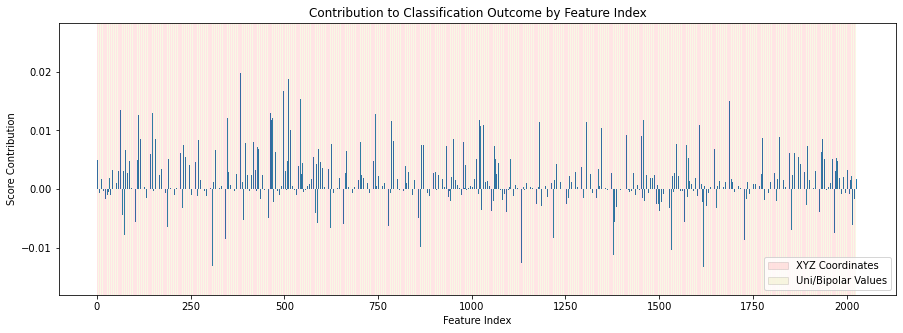

In [110]:
plt.rcParams["figure.figsize"] = (15, 5)

# src: https://stackoverflow.com/questions/46575729/find-the-most-import-features-for-a-svm-classification

# lets use X[2] for getting the feaure contributions.
svc_AF_lin.predict(np.asarray(X_train.iloc[2]).reshape((1, 2030)))
feature_contributions = np.multiply(np.asarray(X_train.iloc[2]).reshape(
    (1, 2030)), svc_AF_lin.coef_).reshape((2030,))
feature_number = np.arange(len(feature_contributions)) + 1

plt.bar(feature_number, feature_contributions, align='center')
plt.xlabel('Feature Index')
plt.ylabel('Score Contribution')
plt.title('Contribution to Classification Outcome by Feature Index')
for i in range(0, 2030, 5):
    if i > 0:
        plt.axvspan(i-5, i-2, facecolor='r', alpha=0.1)
        plt.axvspan(i-2, i, facecolor='y', alpha=0.1)
legend_elements = [Patch(facecolor='r', alpha=0.1, edgecolor='black', label='XYZ Coordinates'),
                   Patch(facecolor='y', alpha=0.1, edgecolor='black', label='Uni/Bipolar Values')]
plt.legend(handles=legend_elements, loc='lower right')
plt.savefig(f"./images/ContributionToClassificationOutcomeByFeatureIndex.png")
plt.show()

In [121]:
XYZ_contribution = 0
polar_values_contribution = 0

feature_contributions_reshaped = feature_contributions.reshape((406, 5))
# the first 3 columns are the XYZ coordinates coefficients of contribution.
# the last two columns are the polar values coefficients of contribution.
# we will add them all up:
XYZ_contribution = np.sum(feature_contributions_reshaped[:, [0, 1, 2]])
polar_values_contribution = np.sum(feature_contributions_reshaped[:, [3, 4]])
unipolar_values_contribution = np.sum(feature_contributions_reshaped[:, 3])
bipolar_values_contribution = np.sum(feature_contributions_reshaped[:, 4])


print(f"XYZ Contributions TOTAL: \t\t{XYZ_contribution}")
print(f"Polar Values Contributions TOTAL: \t{polar_values_contribution}")
print(f"Contribution PER XYZ Coordinate~\t{XYZ_contribution/2018}")
print(f"Contribution PER Polar Value~\t\t{polar_values_contribution/812}")

print(
    f"\n\nContribution of Unipolar Values TOTAL: \t{unipolar_values_contribution}")
print(f"Contribution of Bipolar Values TOTAL: \t{bipolar_values_contribution}")
print(
    f"Contribution of each Unipolar Value~\t{unipolar_values_contribution/406}")
print(
    f"Contribution of each Bipolar Value~\t{bipolar_values_contribution/406}")

XYZ Contributions TOTAL: 		1.5130098431291281
Polar Values Contributions TOTAL: 	0.000921805365606438
Contribution PER XYZ Coordinate~	0.0007497571075961983
Contribution PER Polar Value~		1.1352282827665492e-06


Contribution of Unipolar Values TOTAL: 	0.0005026139543614182
Contribution of Bipolar Values TOTAL: 	0.0004191914112450198
Contribution of each Unipolar Value~	1.2379654048310792e-06
Contribution of each Bipolar Value~	1.0324911607020192e-06


# What We Have Learned

```
The XYZ coordinates features contribute MORE to the classification outcome OVERALL.
If we look on a per-value basis, then the XYZ coordinates features STILL contribute more to the classification outcome.

XYZ Contributions TOTAL: 		1.5130098431291281
Polar Values Contributions TOTAL: 	0.000921805365606438
Contribution PER XYZ Coordinate~	0.0007497571075961983
Contribution PER Polar Value~		1.1352282827665492e-06

When we look at the UNIPOLAR VALUES, we see that they contribute SLIGHTLY more to the classification outcome when
compared to the BIPOLAR VALUES.

Contribution of Unipolar Values TOTAL: 	0.0005026139543614182
Contribution of Bipolar Values TOTAL: 	0.0004191914112450198
Contribution of each Unipolar Value~	1.2379654048310792e-06
Contribution of each Bipolar Value~	1.0324911607020192e-06
```